# Assignment 2
## Bar code detector

Use a combination of image thresholding, edge detection and morphological operations to detect a bar code in an image. The suggested workflow for this project is as follows:

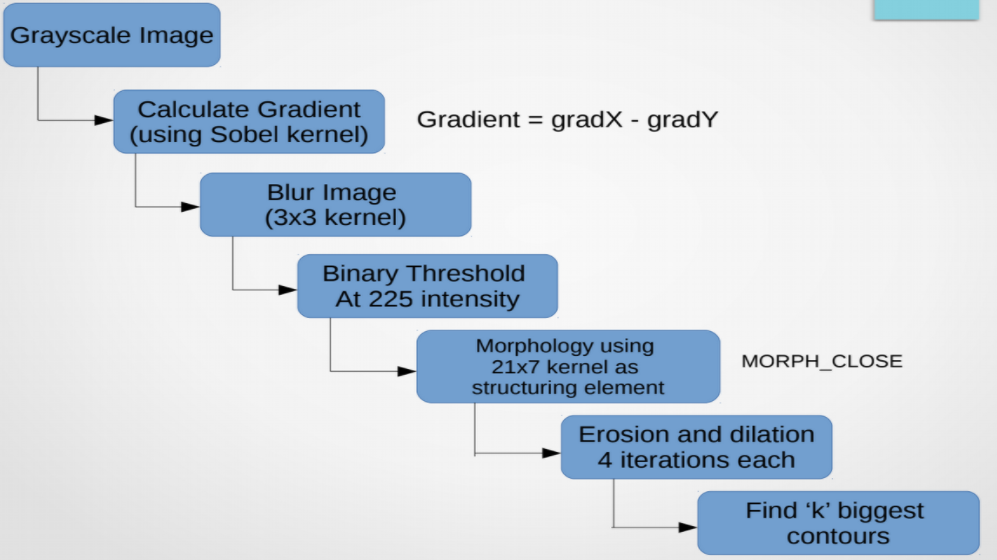

## Comments
Note that this method is one of many valid approaches to detecting bar codes in an image. There is even a Python Library, pyzbar which will automatically find and read barcodes. \
However, the purpose of this assignment is primarily to show how morphological processing can be used to identify features of interest in an image

Also, for the purposes of this assignment, assume only 1 bar code per image


## Submission Details
Assignment deadline: 11:59 pm on Thursday October 9th \
Jupyter Notebook containing submission to be submitted via Canvas \
Total grade: 15% of final module mark \
Submit the assignment as a notebook (i.e. .iynb file) \
Use the following format for your filename: firstname_lastname_assignment2.ipynb

# Submission details:
#### Name: Penikalapati Sai Manoj Kumar
#### ID: 25241477
#### Class code: EE551

In [1]:
# Load in required libraries
%matplotlib inline
import os
import os.path as op
import numpy as np
import cv2
import matplotlib.pylab as plt

In [3]:
# Common Functions Used

def plot_images(images, gray_scale = False):
    fig, axs = plt.subplots(2, 2, figsize=(15, 15))

    axs = axs.ravel()
    
    for i in range(4):
        if (gray_scale):
            axs[i].imshow(images[i], cmap=plt.get_cmap('gray'))
        else:
            axs[i].imshow(images[i])
        axs[i].axis('off')
    
    plt.tight_layout()
    plt.show();

def image_generator(in_imgs, gen):
    out_imgs = [gen(in_imgs[i]) for i in range(4)] 
    return out_imgs

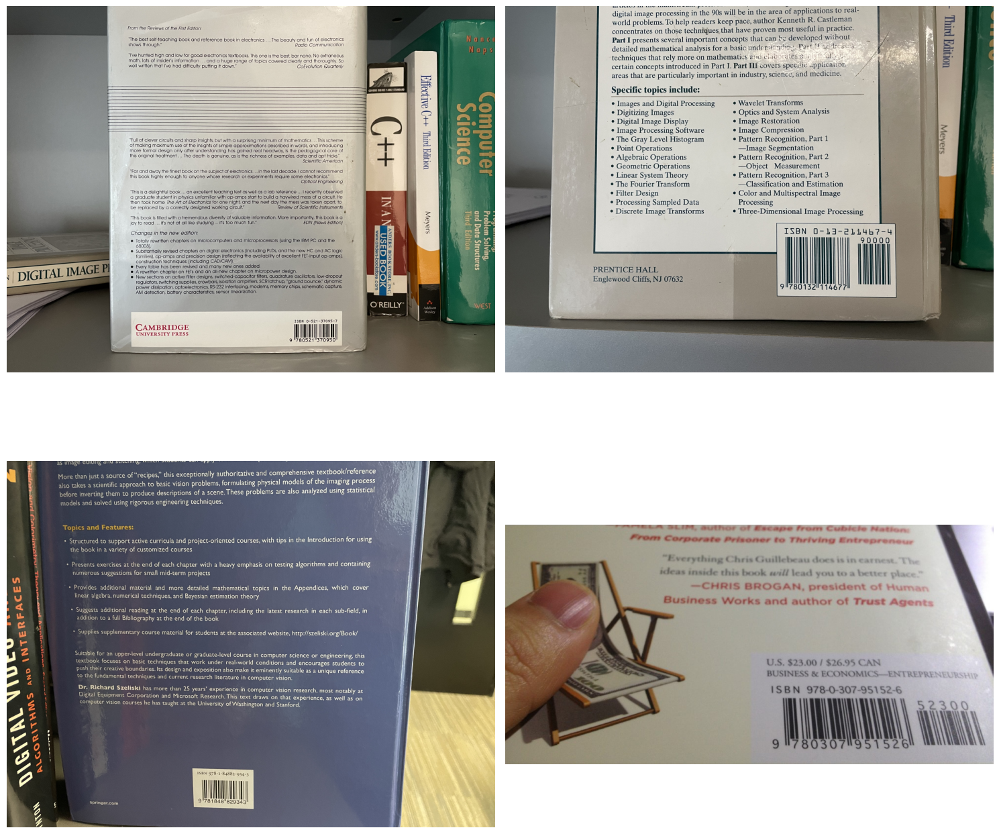

In [4]:
# read in and display image. Note that there are 4 bar code images provided
images = []

for i in range(1, 5):
    img = cv2.imread(f'bar_code{i}.jpg')
    images.append(img)

def rgb_img_gen(img):
    return cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

images = image_generator(images, rgb_img_gen)

# img = cv2.imread('bar_code2.jpg')
# img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB) # convert bgr to rgb

# display image
plot_images(images)

## Convert image to greyscale
Use open cv cvtColor function to do this

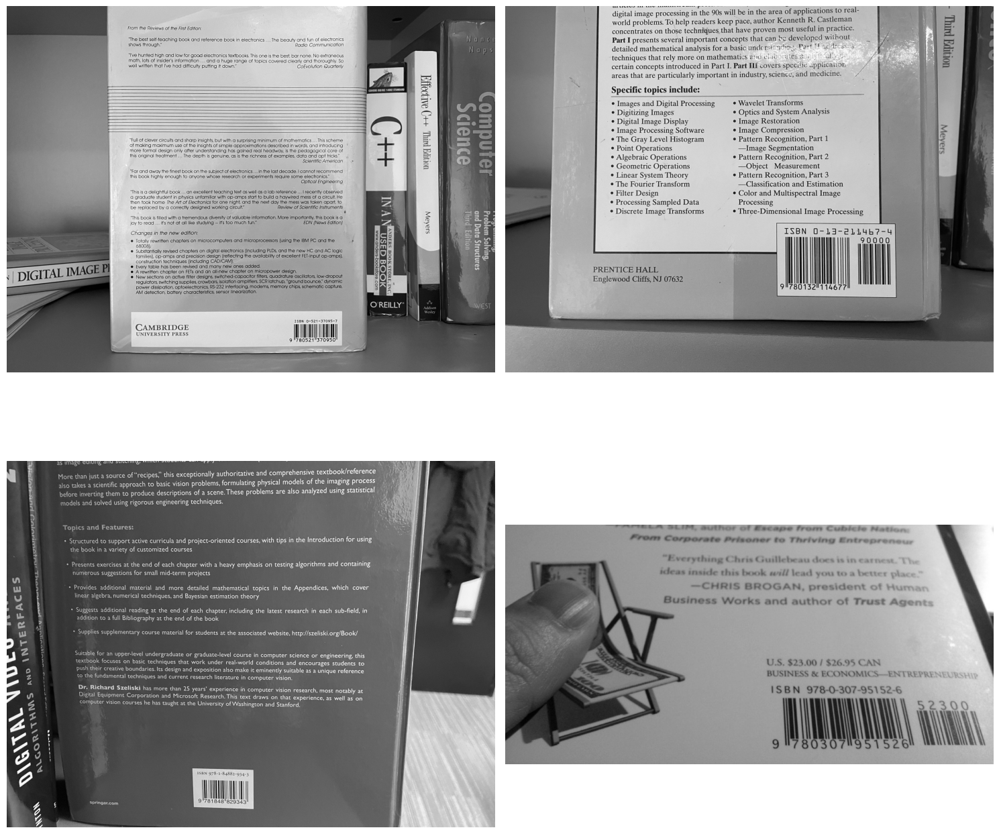

In [5]:
# convert to greyscale using opencv cvtColor
# gray_img = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY) # convert bgr to rgb

def gray_img_gen(img):
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

gray_images = image_generator(images, gray_img_gen)

# display the greyscale image
plot_images(gray_images, True)

## Calculate the image gradients

In this step, you need to find the image gradients (i.e. the edges of the image).
There are a number of ways to do this.

Example gradient functions are cv2.Sobel or cv2.Laplacian. If you use Sobel, it is recommended to try calculating both horizontal and vertical gradients, and use cv2.subtract to subtract x and y gradients. This is done by setting dx and dy parameters. 

Experiment with different "ksize" parameters (size of filtering kernel)
For ddepth, set this to ddepth = cv2.CV_8UC1

For whichever gradient detector is used, once you have calculated the gradients, scale and convert the image using cv2.convertScaleAbs function

When you plot the image, you should have something that looks like this:

![Gradient Image](<gradient image.PNG>)

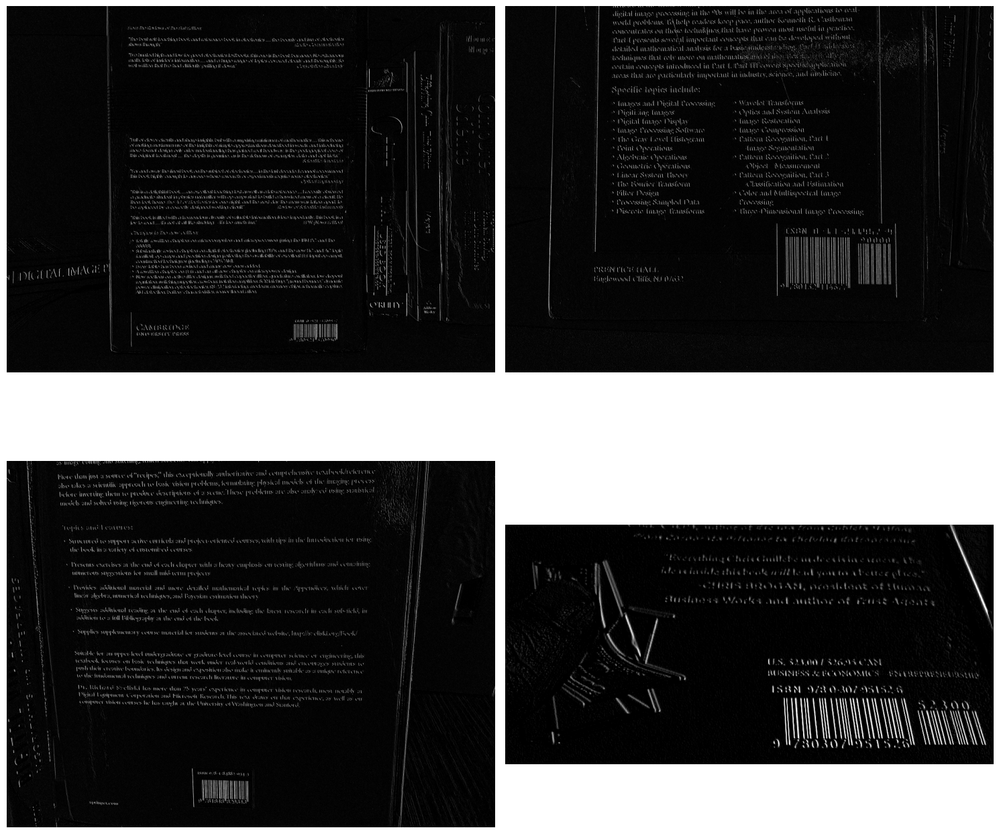

In [6]:
#calculate x & y gradient using Sobel edge detector

def sobel_edge_detector(img):
    scale = 1
    delta = 0
    ddepth = cv2.CV_8UC1
    ksize = 3
        
    grad_x = cv2.Sobel(img, ddepth, 1, 0, ksize=ksize, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)
    
    grad_y = cv2.Sobel(img, ddepth, 0, 1, ksize=ksize, scale=scale, delta=delta, borderType=cv2.BORDER_DEFAULT)
    
    # subtract the y-gradient from the x-gradient
    
    grad_xy = cv2.subtract(grad_x, grad_y)
    
    # scale the image using convertScaleAbs function
    
    abs_grad_xy = cv2.convertScaleAbs(grad_xy)

    return abs_grad_xy

# Alternative - Laplacian

# abs_grad_laplacian = cv2.Laplacian(img, ddepth, ksize=ksize)

# Edge images for all 

edge_images = image_generator(gray_images, sobel_edge_detector)

# display the gradient image
plot_images(edge_images, True)

## Observations on Edge Detection

-> Here I tried using Laplacian and Sobel for Edge Detection

-> For detecting edges using sobel, We need to do it in X and Y seperately and get the absolute difference of them

-> It detects edges much better compared to laplacian. Increasing scale and delta values started adding noise in the image. So, while doing threshold and finding largest contour, it starts deviating to the text of the image instead of barcode.

-> laplacian gets sharp edges which also sometimes causes largest contour to deviate to text in the image.

## Blur the image
This reduces noise and also removes some smaller gradients, and keeps only large gradients

Experiment with different blurring kernels, but the default cv2.blur with a kernel size of 3*3 is a good place to start...

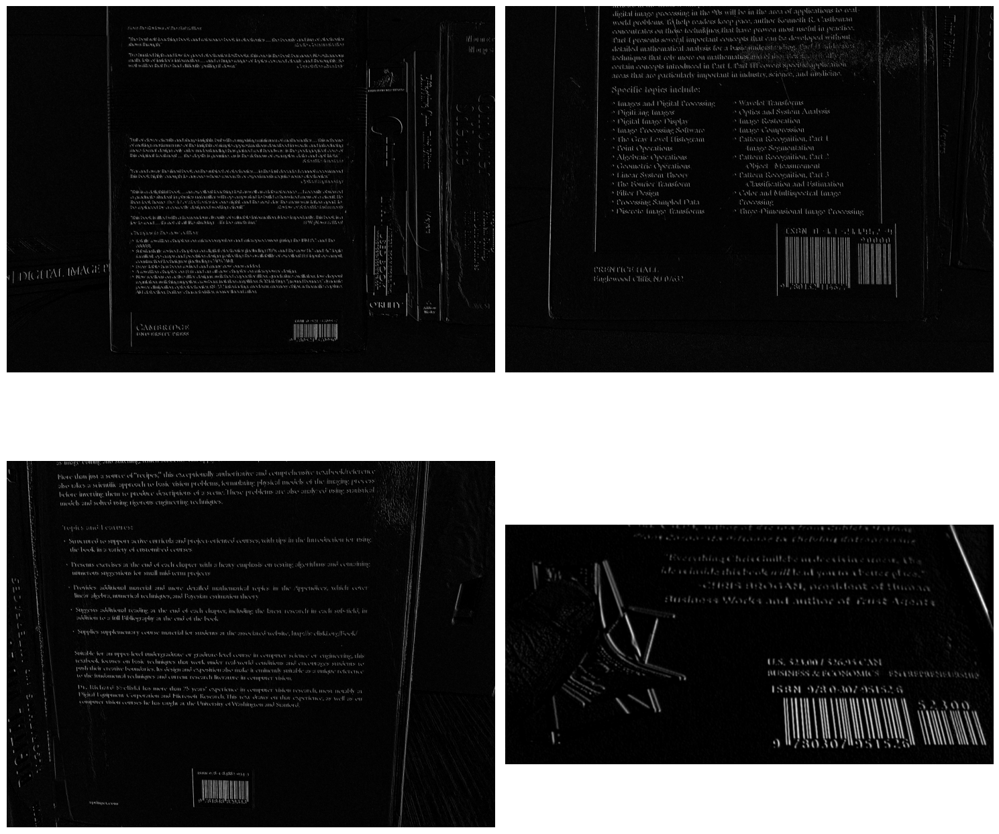

In [7]:
# blur the image

def blur_img_gen(img):
    return cv2.blur(img, (3, 3))

blur_images = image_generator(edge_images, blur_img_gen)

# display the gradient image
plot_images(blur_images, True)

## Observations on Blurring the Image with different Kernels

-> The kernel 3x3 works perfectly for this situation.

-> I used an averaging kernel to blur the image.

-> When you increase the kernel size to 5, 7. The intensity value decreases [as we are doing averaging] and when thresholding at 225, the thresholding image shows nothing. It's blank.

-> I reduced the threshold and tried doing erosion and dilations. The contours started forming at the area where text is in the image.

## Convert to binary image
For this project, use manual thresholding use cv2.threshold.
Experiment with manual thresholding (approx 225 works well) to get a result where the bar code is clearly visible. 

Alternatively, you could try using Otsu's method for automatic thresholding

Your end result should look like this:

![Threshold Image](<threshold image.PNG>)

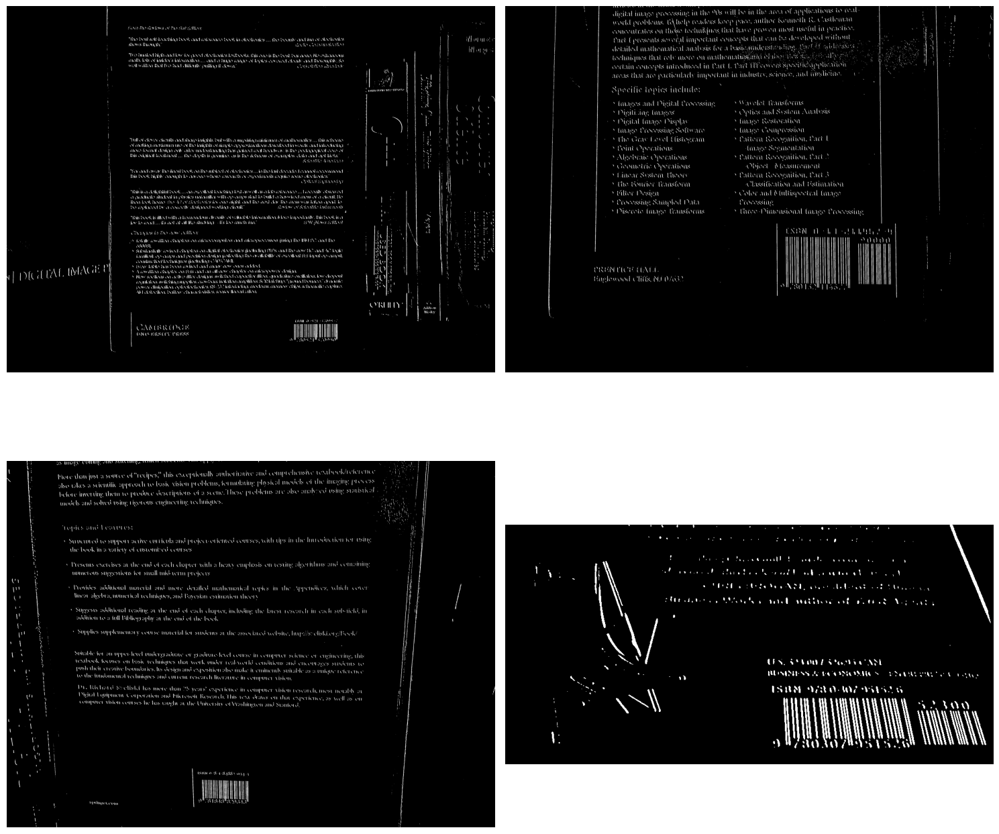

In [8]:
# threshold the image

def threshold_img_gen(img):
    ret, threshold_img = cv2.threshold(img, 225, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    return threshold_img

threshold_images = image_generator(blur_images, threshold_img_gen)

# display the thresholded image
plot_images(threshold_images, True)

## Observations on Thresholding

-> First, I tried using 225 as threshold for binary.  Except for the barcode4,  all the images are showing barcodes a little bit highlighted.

-> The barcode4 image is took in low light conditions. So the intensity values are low compared to others. When using 225 as threshold, almost all values are turned off showing a blank image.

-> So, I tried using otsu along with binary. This provides me with the desired outcome for barcode4 along with no to less changes in others.

## Perform erosion and dilation to clean up image

The purpose of this step is slightly counterintuitive - it is to define a box shaped area where the bar code is

To do this, perform the following steps:
- Define a structuring element with the function cv2.getStructuringElement. A rectangular structuring element should work well for this application...
- Perform morphological closing using the opencv morphologyEx function
- perform an additional set of erosions using opencv erode function. Experiment with the number of iterations. 4 works well..
- perform an additional set of dilations  using opencv dilate function. Experiment with the number of iterations. 4 works well..

After these operations, you should have an image that looks something like this example below. Note that the barcode is now a solid rectangle. This is the shape we want to find in the next step...

![Morphed Image](<morphed image.PNG>)

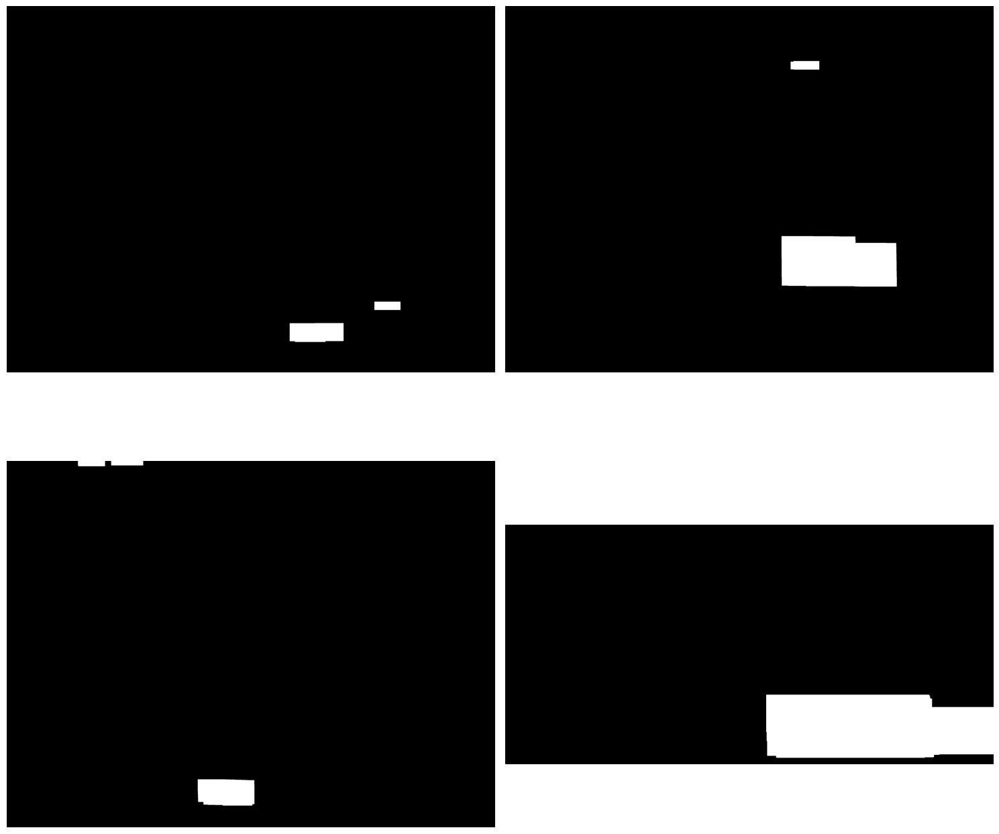

In [9]:
# construct a closing kernel and apply it to the thresholded image

def clean_img_gen(img):
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 10))
    closing_img = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    
    # perform a series of erosions and dilations
    erosion_img = cv2.erode(closing_img, kernel, iterations=4)
    dilation_img = cv2.dilate(erosion_img, kernel, iterations=7)

    return dilation_img

clean_images = image_generator(threshold_images, clean_img_gen)

# display the thresholded image
plot_images(clean_images, True)

## Observations on Eroding and Dilating Images

-> First I tried using a square kernel 5x5. No changes in the iterations mentioned 4 for erosion and 4 for dilation

-> This works for barcode1 and barcode3 as they only have 1 barcode in the images.

-> For barcode2 and barcode4, It is detecting the barcode with largest contour. (Not the 2 bar codes in a single contour)

-> So, I tried using a rectangle kernel with different sizes (15x5, 25x10, 27x10, 30x10). 

-> Except for the 27x10, 30x10. The gap did not get closed for barcode2, it worked well for remaining 3 images. Also I needed to increase the iterations of dilation to close the gap. This did not cause any issue with other images.

-> But I finalised on 30x10 because it almost only forms contours on the barcodes itself not on the text which is ideal case for the problem.

## Find the barcode

Use the opencv findContours function to find counters in your processed image. Contours can be explained simply as a curve joining all the continuous points (along the boundary), having same color or intensity. The contours are a useful tool for shape analysis and object detection and recognition.

Once you have found all of the contours in the image, use the sorted function to arrange the counters by size(hint: set key = cv2.contourArea)\

Define a box around the largest contour using the opencv minAreaRect function\

Use the opencv drawContours function to draw the box around the largest contour (i.e. the barcode area)

Finally, display the output image with a box around the detected barcode for emphasis. Your result should look something like the example below:

NB: You must include output figures from all four test images provided.

![Barcode Found Image](<barcode found.JPG>)

 

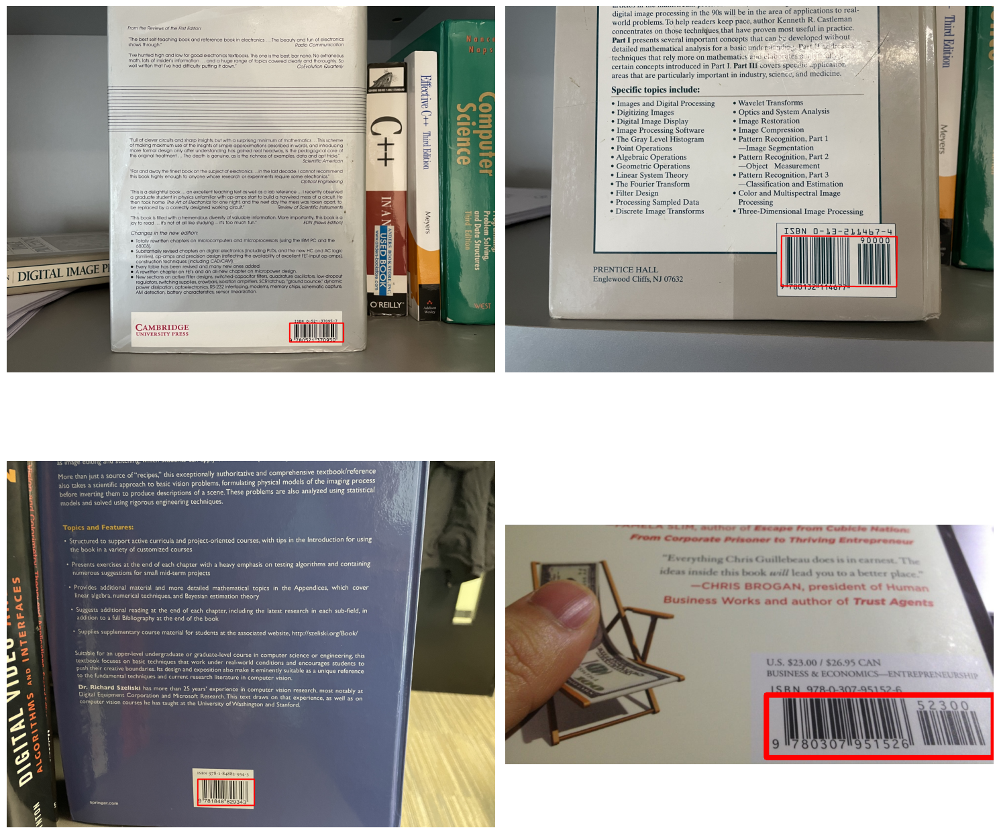

In [10]:
# Find the countours in the image using the cv2.findContours function

def find_barcode(img):
    contours, hierarchy = cv2.findContours(img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    # print(f'contours length: {len(contours)}')
    
    # sort the contours by size using cv2.contourArea
    largest_contour = []
    
    if (len(contours) != 0):
        largest_contour = max(contours, key = lambda x : cv2.contourArea(x))
    # print(f'largest contour: {largest_contour}')
    # print("largest_contour type:", type(largest_contour))
    # print("largest_contour shape:", np.array(largest_contour).shape)
    
    # compute the rotated bounding box of the largest contour
    rect = cv2.minAreaRect(largest_contour)
    
    # draw a bounding box arounded the detected barcode and display the
    # image
    box = cv2.boxPoints(rect)
    # print("box shape:", box.shape)
    box = box.astype(np.int32)

    return box

detected_images = []

for i in range(4):
    detected_img = images[i].copy()
    box = find_barcode(clean_images[i])
    cv2.drawContours(detected_img,[box],0,(255,0,0),10)
    detected_images.append(detected_img)
    
# display the thresholded image
plot_images(detected_images)

## Commentary and Suggested Improvements

This process works reasonably well for many images, but will not always find the correct answer. Use this space to "critique" your appproach, comment on what worked well, which images were challenging and why etc. Suggest ways to improve the performance of this algorithm. Note: stating "use deep learning", or any variation of this statement, is not acceptable!!! :-) 

-> I think for these kind of images, most cases blur kernel 3x3 may be ideal as it reduces the noise but also keeps the intensity values close to the real values of images

-> For edge detection sobel is better as it causes less noise compared to laplacian

-> For thresholding, otsu is better because it adopts to the lighting conditions in the image and gives correct outline for the image. Manual thresholding may not work for all images like here in barcode4

-> The real challenge faced here is finding the right number of iterations for dilation, erosion and correct closing kernel size. I had to test multiple number of times with different combinations to make this work for all images

-> This may not work for multiple barcodes alligned vertically. Finding adaptive kernel sizes and number of iterations for dilation, erosion
on the go for each image is more manual.

-> If this can be made automated, this system works well for different kind of situations and images